In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse

df = pd.read_csv('/Users/alanchan/Documents/UCL/Year 4/ELEC0088/SNS assignment 22-23/London Weather data/london_weather.csv')
print(df.info())
df.dropna(inplace= True)
df.reset_index(drop=True, inplace=True)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15341 entries, 0 to 15340
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              15341 non-null  int64  
 1   cloud_cover       15322 non-null  float64
 2   sunshine          15341 non-null  float64
 3   global_radiation  15322 non-null  float64
 4   max_temp          15335 non-null  float64
 5   mean_temp         15305 non-null  float64
 6   min_temp          15339 non-null  float64
 7   precipitation     15335 non-null  float64
 8   pressure          15337 non-null  float64
 9   snow_depth        13900 non-null  float64
dtypes: float64(9), int64(1)
memory usage: 1.2 MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13843 entries, 0 to 13842
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              13843 non-null  int64  
 1   cloud_cover      

In [2]:
# print(df.tail())
df=df[["date","mean_temp"]]
df.columns = ['ds','y']
df['ds'] = pd.to_datetime(df['ds'], format='%Y%m%d')
print(df.tail())

              ds    y
13838 2019-12-27  7.5
13839 2019-12-28  8.1
13840 2019-12-29  8.7
13841 2019-12-30  6.5
13842 2019-12-31  7.1


In [3]:
df.sort_values(by='ds', inplace = True)
df.reset_index(drop=True, inplace=True)
# print(df.head())
print(df.tail())

              ds    y
13838 2019-12-27  7.5
13839 2019-12-28  8.1
13840 2019-12-29  8.7
13841 2019-12-30  6.5
13842 2019-12-31  7.1


13843


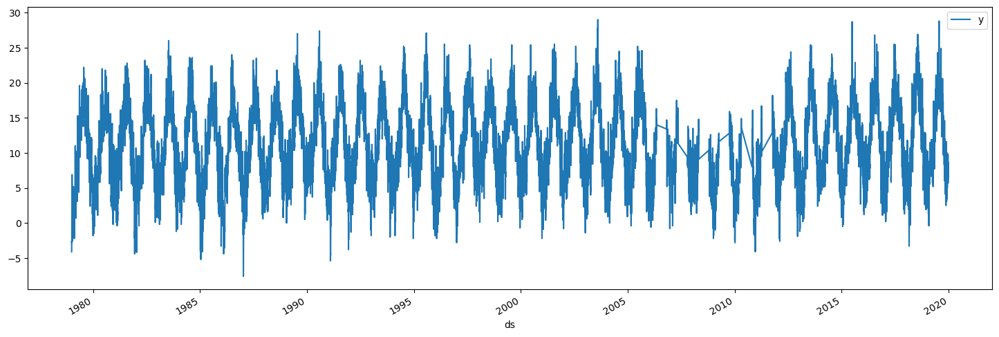

In [4]:
df.plot(x='ds',y='y',figsize=(18,6))
print(len(df))

In [5]:
train = df.iloc[:len(df)-365]
test = df.iloc[len(df)-365:]

print(len(train))
print(len(test))

print(df.tail())

13478
365
              ds    y
13838 2019-12-27  7.5
13839 2019-12-28  8.1
13840 2019-12-29  8.7
13841 2019-12-30  6.5
13842 2019-12-31  7.1


In [6]:
m = Prophet()
m.fit(train)
future = m.make_future_dataframe(periods=365) #MS for monthly, H for hourly
forecast = m.predict(future)
print(df.tail())
print(future.tail())

# forecast.tail()
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
# future.tail()
# future.head()

12:41:46 - cmdstanpy - INFO - Chain [1] start processing
12:41:48 - cmdstanpy - INFO - Chain [1] done processing


              ds    y
13838 2019-12-27  7.5
13839 2019-12-28  8.1
13840 2019-12-29  8.7
13841 2019-12-30  6.5
13842 2019-12-31  7.1
              ds
13838 2019-12-27
13839 2019-12-28
13840 2019-12-29
13841 2019-12-30
13842 2019-12-31


,ds,yhat,yhat_lower,yhat_upper
13838,2019-12-27,6.816838,3.236434,10.421669
13839,2019-12-28,6.728422,3.031389,10.179679
13840,2019-12-29,6.738119,3.291395,10.415282
13841,2019-12-30,6.726578,3.317992,10.252504
13842,2019-12-31,6.692336,2.748591,10.504025


In [7]:
plot_plotly(m ,forecast)

In [8]:
plot_components_plotly(m, forecast)

In [9]:
predictions = forecast.iloc[-365:]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())

Root Mean Squared Error between actual and  predicted values:  2.5912973352978557
Mean Value of Test Dataset: 12.193972602739736


In [10]:
training = forecast.iloc[:len(forecast)-365]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(training,train['y']))

Root Mean Squared Error between actual and  predicted values:  2.8687082918942752
